In [1]:
"""
Created on Fri Mar 14 17:13:16 2024
@author: Wu Yuxuan
"""

import os
import warnings

import pandas as pd
import anndata as ad
import scanpy as sc
import seaborn as sns
import numpy as np
import decoupler as dc
import gseapy as gp
from gseapy import Msigdb
from matplotlib import rc_context
from matplotlib import pyplot as plt
from adjustText import adjust_text

from statannotations.Annotator import Annotator

%matplotlib inline

In [2]:
seed = 123

warnings.simplefilter(action='ignore', category=FutureWarning)
# info
sc.set_figure_params(vector_friendly=True, dpi_save=1200) 
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

scanpy==0.1.dev3254+g5b9bc72 anndata==0.10.3 umap==0.5.5 numpy==1.26.0 scipy==1.11.3 pandas==1.5.2 scikit-learn==1.1.3 statsmodels==0.14.0 igraph==0.10.8 louvain==0.8.1 pynndescent==0.5.11


In [3]:
os.chdir('/home/wu/datb1/reseq_ppp/Pub_PPP_code')

In [4]:
adata_inte = sc.read_h5ad('/home/wu/datb1/reseq_ppp/scanvi_integrated/INTEGRATED_ANNO_IL17_treatment.h5ad')

In [5]:
adata_inte.obs['batch_group'] = adata_inte.obs['batch_group'].astype(str)
adata_inte.obs.loc[adata_inte.obs.batch == 'PT_PPPC_P99C_10X', 'batch_group'] = 'After_IL17_treatment_control'
adata_inte.obs['batch_group'] = adata_inte.obs['batch_group'].astype('category')

In [6]:
1 - (adata_inte.obs.C_scANVI == 'Unknown').sum() / (adata_inte.obs.leiden == 'Unknown').sum()

0.4839219820769636

### Fraction enrichment

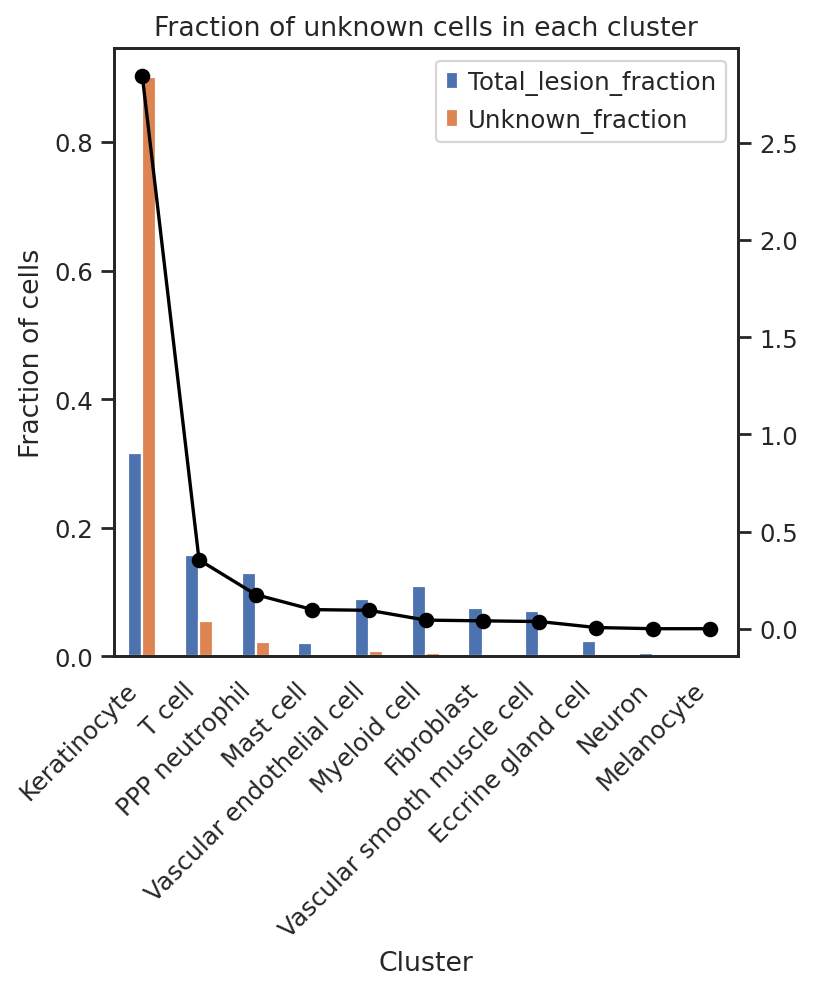

In [7]:
unknown_fraction =  adata_inte.obs.loc[adata_inte.obs.C_scANVI == 'Unknown', 'leiden_scanvi'].value_counts() / adata_inte.obs.loc[adata_inte.obs.C_scANVI == 'Unknown', 'leiden_scanvi'].value_counts().sum()
total_lesion_fraction =  adata_inte.obs.loc[adata_inte.obs['batch_group'] == 'Lesion', 'leiden_scanvi'].value_counts() / adata_inte.obs.loc[adata_inte.obs['batch_group'] == 'Lesion', 'leiden_scanvi'].value_counts().sum()

df_plot = pd.DataFrame({
    'Unknown_fraction': unknown_fraction,
    'Total_lesion_fraction': total_lesion_fraction,
    'Ratio': unknown_fraction / total_lesion_fraction
}).sort_values('Ratio', ascending=False)

# plot fraction of unknown cells in each cluster before and after IL-17 treatment
sns.set_theme(style='white', font_scale=1)
fig, ax = plt.subplots(figsize=(5, 5))
df_plot[['Total_lesion_fraction', 'Unknown_fraction']].plot(kind='bar', ax=ax)
# add ratio as line plot
df_plot['Ratio'].plot(kind='line', ax=ax, color='black', secondary_y=True, marker='o')
ax.set_ylabel('Fraction of cells')
ax.set_xticklabels(df_plot.index, rotation=45, ha='right')
ax.set_xlabel('Cluster')
ax.set_title('Fraction of unknown cells in each cluster')
plt.savefig('figures/fig6/unknown_fraction_each_cluster.pdf', bbox_inches='tight')

### Metadata

In [8]:
# find index of Unknown cluster

unknown_index = adata_inte.obs.leiden.cat.categories.get_loc('Unknown')
adata_inte.uns['leiden_colors'][unknown_index] = '#d3d3d3'
adata_inte.uns['C_scANVI_colors'][unknown_index] = '#d3d3d3'

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


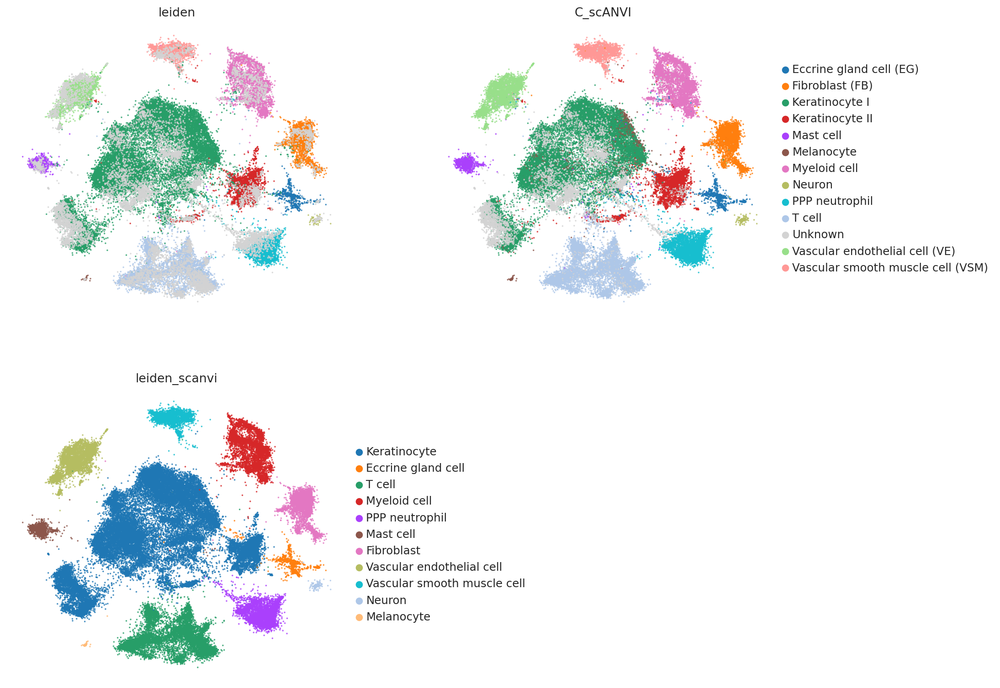

In [12]:
with rc_context({'figure.figsize': (6, 5.5)}):
    ax = sc.pl.embedding(adata_inte, basis='X_mde_scanvi', color=['leiden', 'C_scANVI', 'leiden_scanvi'], frameon=False, size=10, alpha=0.8, show=False, ncols=2)
    ax[0].legend().set_visible(False)
    plt.savefig('figures/fig6/scanvi_embedding.pdf', bbox_inches='tight')

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


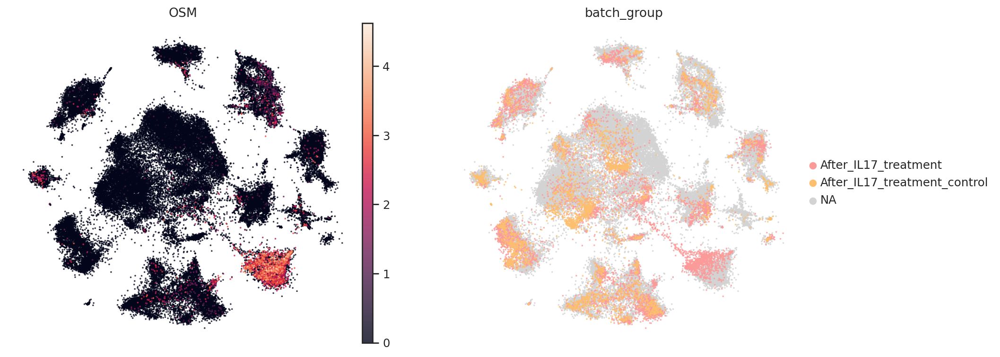

In [34]:
with rc_context({'figure.figsize': (6, 5.5)}):
    ax = sc.pl.embedding(adata_inte, basis='X_mde_scanvi', color=['OSM', 'batch_group'], groups=['After_IL17_treatment', 'After_IL17_treatment_control'], frameon=False, size=10, alpha=0.8, show=False, ncols=2,
                         palette=sns.color_palette("Paired")[4::2])
    ax[0].legend().set_visible(False)
    plt.savefig('figures/fig6/scanvi_embedding_osm.pdf', bbox_inches='tight')

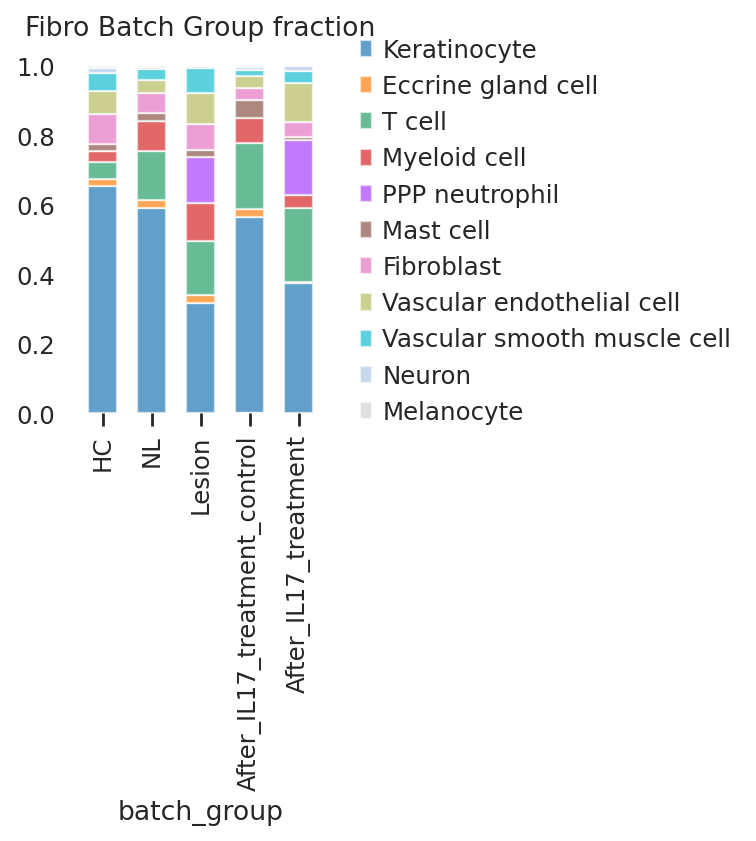

In [25]:
adata_inte.obs['batch_group'] = adata_inte.obs['batch_group'].cat.reorder_categories(['HC', 'NL', 'Lesion', 'After_IL17_treatment_control', 'After_IL17_treatment'], ordered=True)
df_inte = adata_inte.obs.copy()

# plot figure
with rc_context({'figure.figsize': (2, 3)}):
    ax = (df_inte.groupby(['batch_group', 'leiden_scanvi']).size() / df_inte.groupby('batch_group').size()).unstack() \
        .plot.bar(stacked=True, color=adata_inte.uns['leiden_colors'], width=0.6, alpha=0.7)
    ax.legend(bbox_to_anchor=(1.1, 0.5), loc='center left', borderaxespad=0., frameon=False)
    sns.despine(left=True, bottom=True)
    plt.title("Fibro Batch Group fraction")
    # plt.savefig('figures/fig5/bar_fibro_dermis_batch_group.pdf', bbox_inches="tight")
    plt.tick_params(top=False,bottom=True,left=False,right=False)

### KC subgroup

In [10]:
adata_inte_kc = adata_inte[adata_inte.obs.leiden_scanvi.str.contains('Keratinocyte')].copy()
sc.pp.neighbors(adata_inte_kc, n_neighbors=15, use_rep='X_scANVI')
sc.tl.umap(adata_inte_kc)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:19)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


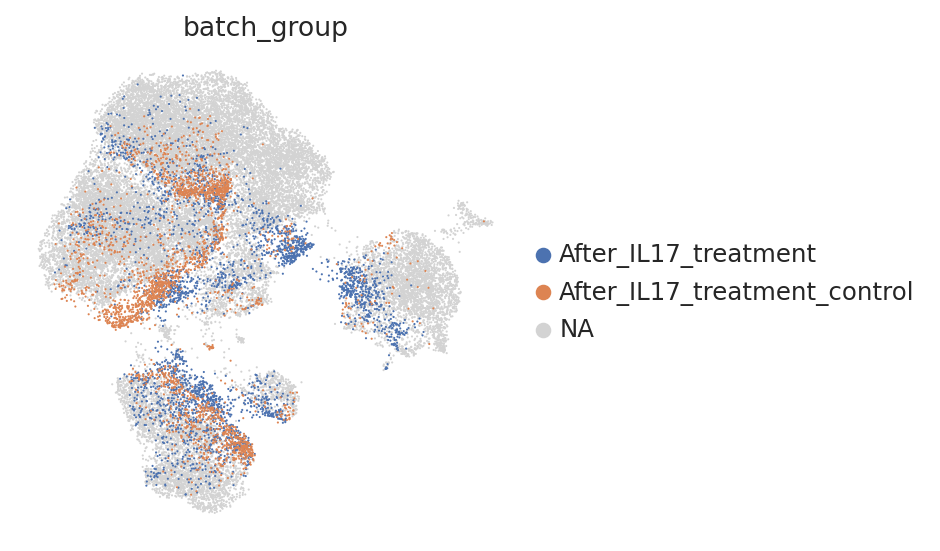

<Figure size 320x320 with 0 Axes>

In [11]:
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(adata_inte_kc, color=['batch_group'], groups=['After_IL17_treatment', 'After_IL17_treatment_control'], frameon=False)
    plt.savefig('figures/fig6/umap_keratinocyte_IL17_treatment.pdf', bbox_inches='tight')

In [12]:
adata_inte_kc_il17 = adata_inte_kc[adata_inte_kc.obs['IL17_treatment'] == True,:].raw.to_adata().copy()
# adata_inte_kc_il17.obs

In [13]:
sc.tl.rank_genes_groups(adata_inte_kc_il17, 'batch_group', method='wilcoxon', n_genes=8000, groups=['After_IL17_treatment'], reference='After_IL17_treatment_control', tie_correct=True)
df_ipa = sc.get.rank_genes_groups_df(adata_inte_kc_il17, group='After_IL17_treatment', key='rank_genes_groups', pval_cutoff=1e-5, log2fc_min=1.5)
df_ipa[['names', 'logfoldchanges', 'pvals', 'pvals_adj']].to_csv('charts/il17_treated_DEG_Lesion_vs_Control.tsv', sep='\t', index=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)


/home/wu/scanpy/scanpy/tools/_rank_genes_groups.py:286: RuntimeWarning: invalid value encountered in divide
  scores = (


run ipa...

In [15]:
ipa_il17 = pd.read_csv('/home/wu/datb1/reseq_ppp/Pub_PPP_code/charts/IPA_cytokine_il17_upstream.txt', sep='\t', skiprows=2)
ipa_lesion = pd.read_csv('/home/wu/datb1/reseq_ppp/Pub_PPP_code/charts/IPA_cytokine_kc_upstream.txt', sep='\t', skiprows=2)

bump_df = ipa_lesion['Upstream Regulator'].reset_index().set_index('Upstream Regulator')
after_df = ipa_il17['Upstream Regulator'].reset_index().set_index('Upstream Regulator')
bump_df = bump_df.join(after_df, lsuffix='_lesion', rsuffix='_il17', how='left')
bump_df = bump_df.dropna().astype(int)
bump_df = bump_df + 1

In [16]:
def bumpchart(df, show_rank_axis= True, rank_axis_distance= 1.1, top_n = 20, color_n = 5,
              ax= None, scatter= False, holes= False,
              line_args= {}, scatter_args= {}, hole_args= {}):
    
    if ax is None:
        left_yaxis= plt.gca()
    else:
        left_yaxis = ax

    # Creating the right axis.
    right_yaxis = left_yaxis.twinx()
    
    axes = [left_yaxis, right_yaxis]
    
    # Creating the far right axis if show_rank_axis is True
    if show_rank_axis:
        far_right_yaxis = left_yaxis.twinx()
        axes.append(far_right_yaxis)
    
    for ind, col in enumerate(df.columns):
        y = df[col]
        x = df.index.values
        if df[col][x[1]]<df[col][x[0]] and df[col][x[1]] < color_n:
            rank_diff = df[col][x[0]] - df[col][x[1]]
            # rank_diff determines the saturation of the color
            col_color = sns.color_palette(palette='Blues')[min(rank_diff, 5)]
        else:
            col_color = sns.palettes.color_palette('tab20c')[-1]
        
        # Plotting blank points on the right axis/axes 
        # so that they line up with the left axis.
        for axis in axes[1:]:
            axis.plot(x, y, alpha = 0)

        left_yaxis.plot(x, y, **line_args, solid_capstyle='round', color=col_color)
        
        # Adding scatter plots
        if scatter:
            left_yaxis.scatter(x, y, **scatter_args, color=col_color)
            
            #Adding see-through holes
            if holes:
                bg_color = left_yaxis.get_facecolor()
                left_yaxis.scatter(x, y, color= bg_color, **hole_args)

    y_ticks = [*range(1, top_n + 1)]
    
    # Configuring the axes so that they line up well.
    for axis in axes:
        axis.invert_yaxis()
        axis.set_yticks(y_ticks)
        axis.set_ylim((top_n + 0.5, 0.5))
    
    # Sorting the labels to match the ranks.
    left_labels = df.iloc[0].sort_values().index[:top_n]
    right_labels = ipa_il17['Upstream Regulator'][:top_n]
    
    left_yaxis.set_yticklabels(left_labels)
    right_yaxis.set_yticklabels(right_labels)
    
    # Setting the position of the far right axis so that it doesn't overlap with the right axis
    if show_rank_axis:
        far_right_yaxis.spines["right"].set_position(("axes", rank_axis_distance))
    
    return axes

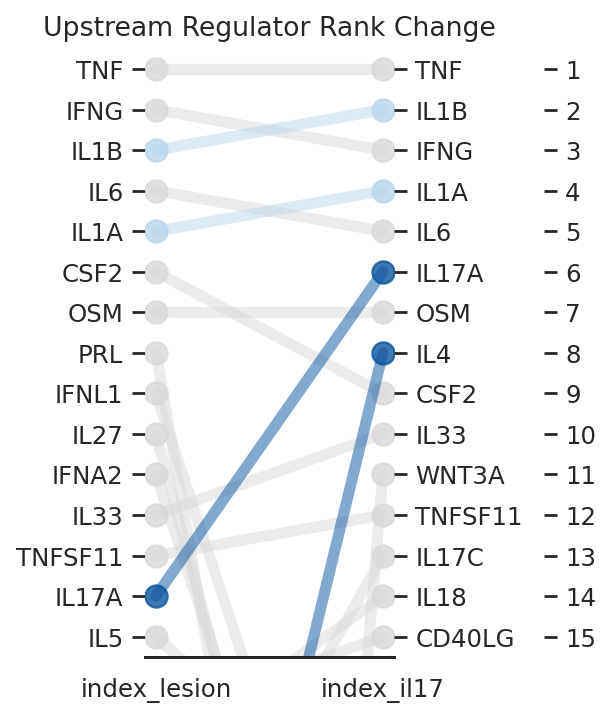

In [18]:
plt.figure(figsize=(2, 5))
bumpchart(bump_df.T, show_rank_axis= True, scatter= True, holes= False, rank_axis_distance= 1.6, color_n = 10, top_n= 15,
          line_args= {"linewidth": 5, "alpha": 0.5}, scatter_args= {"s": 100, "alpha": 0.8,}) ## bump chart class with nice examples can be found on github
sns.despine(left= True, right= True)
plt.title('Upstream Regulator Rank Change')
plt.savefig('figures/fig6/upstream_regulator_rank_change.pdf', bbox_inches='tight')
plt.show()

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


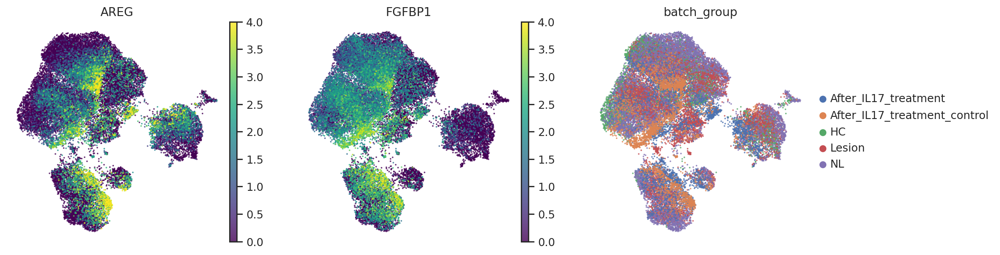

In [19]:
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(adata_inte_kc, color=['AREG', 'FGFBP1', 'batch_group'], frameon=False, size=10, alpha=0.8, show=False, vmin=0, vmax=4, cmap='viridis')
    plt.savefig('figures/fig6/umap_keratinocyte_upstream_regulator.pdf', bbox_inches='tight')

### GSEA of IL17

In [20]:
sc.tl.rank_genes_groups(adata_inte_kc, groupby='batch_group', method='wilcoxon', n_genes=8000, groups=['After_IL17_treatment'], reference='After_IL17_treatment_control', tie_correct=True)
df_After_IL17_treatment = sc.get.rank_genes_groups_df(adata_inte_kc, group='After_IL17_treatment', key='rank_genes_groups', log2fc_min=1, pval_cutoff=0.05)
df_After_IL17_treatment

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)


/home/wu/scanpy/scanpy/tools/_rank_genes_groups.py:286: RuntimeWarning: invalid value encountered in divide
  scores = (


,names,scores,logfoldchanges,pvals,pvals_adj
0,KRT6A,42.373558,3.058887,0.000000e+00,0.000000e+00
1,S100A8,38.020893,2.872292,0.000000e+00,0.000000e+00
2,S100A9,34.321392,2.454895,3.764291e-258,1.155186e-254
3,CXCL8,31.154243,2.837007,4.443495e-213,9.740141e-210
4,S100A7,29.921211,2.419288,1.042662e-196,1.454418e-193
...,...,...,...,...,...
1284,CAMK1G,2.222984,19.917372,2.621690e-02,4.883720e-02
1285,CD8B,2.222984,20.399590,2.621690e-02,4.883720e-02
1286,LINC01615,2.222984,20.355442,2.621690e-02,4.883720e-02
1287,PRKG1,2.222984,21.081289,2.621690e-02,4.883720e-02


In [21]:
# use  GO:BP: GO Biological Process
# Down load gmt file from: https://data.broadinstitute.org/gsea-msigdb/msigdb/release/
msig = Msigdb()
gmt_go_bp = msig.get_gmt(category="c5.go.bp", dbver='2023.2.Hs')
gmt_hallmark = msig.get_gmt(category="h.all", dbver='2023.2.Hs')

il17_pathway_set = {'GOBP_RESPONSE_TO_INTERLEUKIN_17': gmt_go_bp['GOBP_RESPONSE_TO_INTERLEUKIN_17']}
jak_stat_pathway_set = {'HALLMARK_IL6_JAK_STAT3_SIGNALING': gmt_hallmark['HALLMARK_IL6_JAK_STAT3_SIGNALING']}

intersect_genes = set(il17_pathway_set['GOBP_RESPONSE_TO_INTERLEUKIN_17']) & set(jak_stat_pathway_set['HALLMARK_IL6_JAK_STAT3_SIGNALING'])
print(intersect_genes)
il17_pathway_set_unique = {'GOBP_RESPONSE_TO_INTERLEUKIN_17_UNIQUE': list(set(il17_pathway_set['GOBP_RESPONSE_TO_INTERLEUKIN_17']) - intersect_genes)}
jak_stat_pathway_set_unique = {'HALLMARK_IL6_JAK_STAT3_SIGNALING_UNIQUE': list(set(jak_stat_pathway_set['HALLMARK_IL6_JAK_STAT3_SIGNALING']) - intersect_genes)}

# gmt_hallmark.update(jak_stat_pathway_set_unique)
gmt_go_bp.update(il17_pathway_set_unique)

df_gsea_prerank = sc.get.rank_genes_groups_df(adata_inte_kc, group='After_IL17_treatment', key='rank_genes_groups')
# df_gsea_prerank = df_gsea_prerank[(df_gsea_prerank.logfoldchanges > 1) | (df_gsea_prerank.logfoldchanges < -1)]
df_gsea_prerank = df_gsea_prerank.loc[:, ['names', 'logfoldchanges']].set_index('names').sort_values('logfoldchanges', ascending=False)
df_gsea_prerank.head()

res = gp.prerank(rnk=df_gsea_prerank, # or data
                     gene_sets=gmt_hallmark,
                     threads=4,
                     min_size=5,
                     max_size=1000,
                     permutation_num=1000, # reduce number to speed up testing
                     outdir=None, # don't write to disk
                     seed=6,
                     verbose=True, # see what's going on behind the scenes
                    )


2024-05-30 12:23:17,372 [WARNING] Duplicated values found in preranked stats: 0.99% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-05-30 12:23:17,373 [INFO] Parsing data files for GSEA.............................
2024-05-30 12:23:17,374 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=5
2024-05-30 12:23:17,374 [INFO] 0050 gene_sets used for further statistical testing.....
2024-05-30 12:23:17,375 [INFO] Start to run GSEA...Might take a while..................


{'CXCL10', 'SOCS3', 'STAT3', 'IL17RA', 'IL1B'}


2024-05-30 12:23:18,022 [INFO] Congratulations. GSEApy runs successfully................



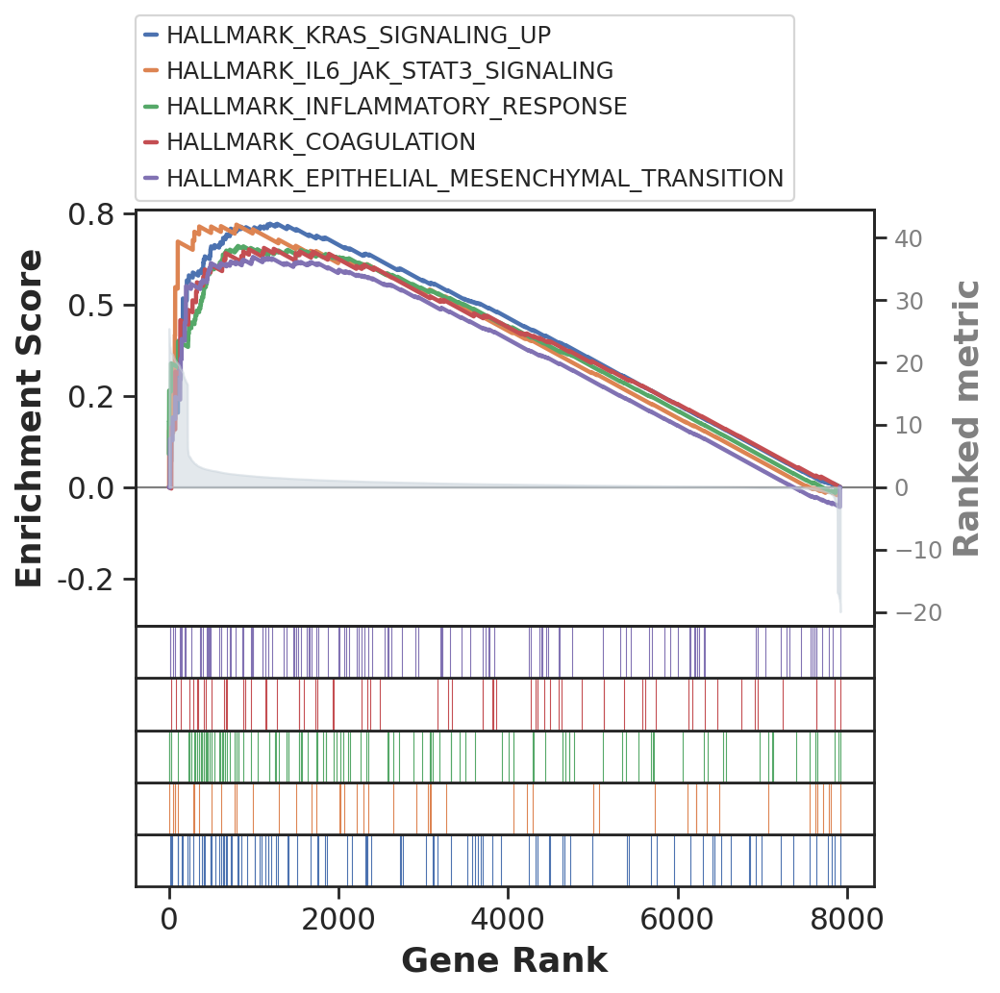

In [22]:
res.res2d = res.res2d.sort_values(by='NES', ascending=False)
jak_index = res.res2d[res.res2d.Term == 'HALLMARK_IL6_JAK_STAT3_SIGNALING'].index[0]
# jak_unique_index = res.res2d[res.res2d.Term == 'HALLMARK_IL6_JAK_STAT3_SIGNALING_UNIQUE'].index[0]
term = res.res2d.Term
term = list(term[:5])
# gp.gseaplot(res.ranking, term=term[i], **res.results[term[i]])
with plt.rc_context({'figure.figsize': (12, 6)}):
    res.plot(terms=term)
    plt.savefig('figures/fig6/gsea_il17_jak_stat.pdf', bbox_inches='tight')

In [23]:
del adata_inte_kc

### T cell

In [24]:
adata_immu = sc.read_h5ad('/home/wu/datb1/reseq_ppp/processed_data/IMMU_PPP_10X.h5ad')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_scanvi_t_cell_manual', the cluster labels (adata.obs, categorical) (0:00:00)


/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


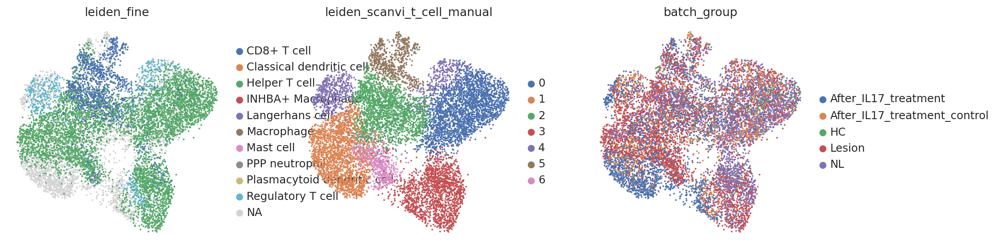

In [25]:
adata_inte_t_cell = adata_inte[adata_inte.obs.leiden_scanvi == 'T cell'].copy()
adata_inte_t_cell.obs['leiden_fine'] = 'Unknown'
adata_inte_t_cell.obs['leiden_fine'] = adata_immu.obs['leiden']

sc.pp.neighbors(adata_inte_t_cell, use_rep='X_scANVI', n_neighbors=30)
sc.tl.umap(adata_inte_t_cell)
sc.tl.leiden(adata_inte_t_cell, resolution=0.5, key_added='leiden_scanvi_t_cell_manual')
sc.pl.umap(adata_inte_t_cell, color=['leiden_fine', 'leiden_scanvi_t_cell_manual', 'batch_group'], frameon=False)

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


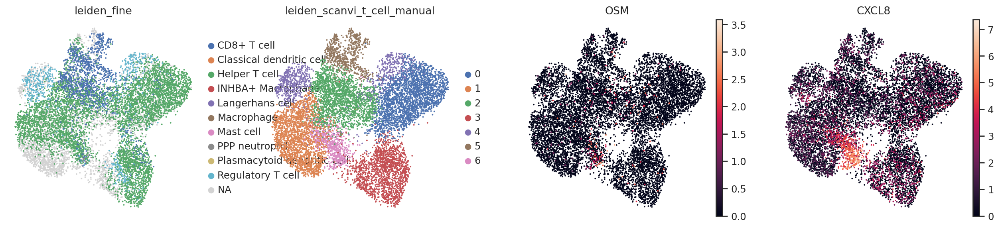

In [26]:
sc.pl.umap(adata_inte_t_cell, color=['leiden_fine', 'leiden_scanvi_t_cell_manual', 'OSM', 'CXCL8'], frameon=False)

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


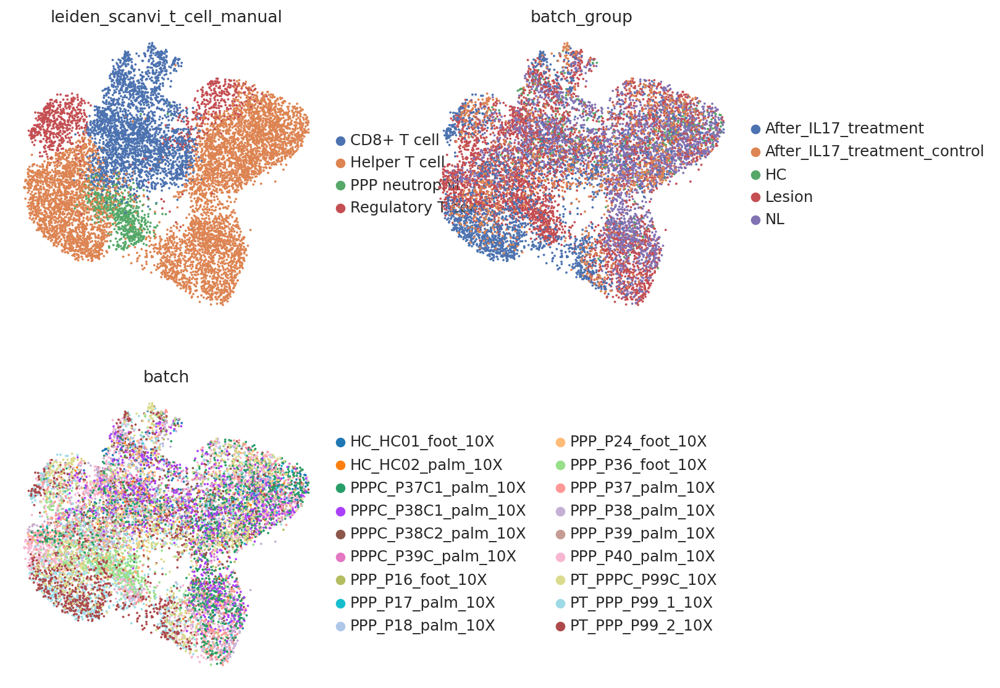

In [27]:
new_cluster_names = {
    '0': 'Helper T cell',
    '1': 'Helper T cell',
    '2': 'CD8+ T cell',
    '3': 'Helper T cell',
    '4': 'Regulatory T cell',
    '5': 'CD8+ T cell',
    '6': 'PPP neutrophil',
}

adata_inte_t_cell.obs['leiden_scanvi_t_cell_manual'] = adata_inte_t_cell.obs['leiden_scanvi_t_cell_manual'].map(new_cluster_names).astype('category')
sc.pl.umap(adata_inte_t_cell, color=['leiden_scanvi_t_cell_manual', 'batch_group', 'batch'], ncols=2, frameon=False)

In [28]:
adata_inte_t_cell = adata_inte_t_cell[adata_inte_t_cell.obs['leiden_scanvi_t_cell_manual'] != 'PPP neutrophil'].copy()

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


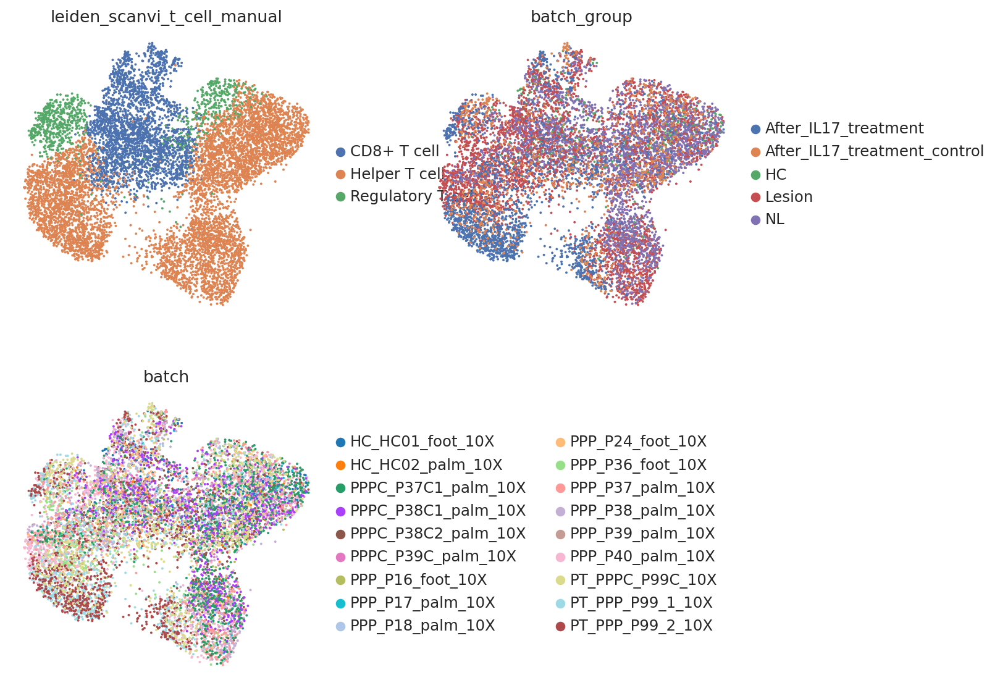

In [29]:
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(adata_inte_t_cell, color=['leiden_scanvi_t_cell_manual', 'batch_group', 'batch'], ncols=2, frameon=False, show=False)
    plt.savefig('figures/fig6/umap_t_cell_IL17_treatment.pdf', bbox_inches='tight')

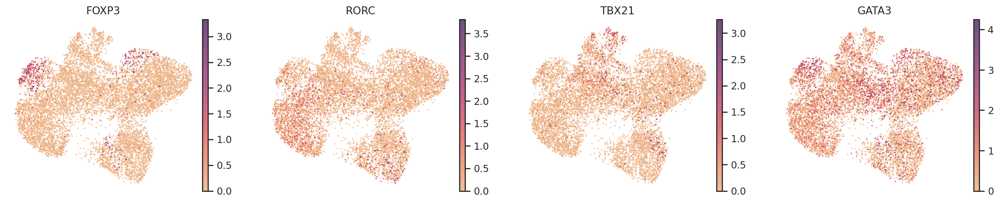

In [30]:
with rc_context({'figure.figsize': (4, 3.5)}):
    sc.pl.umap(adata_inte_t_cell, color=['FOXP3', 'RORC', 'TBX21', 'GATA3'], frameon=False, size=10, alpha=0.8, show=False, ncols=4, cmap='flare')
    plt.savefig('figures/fig6/umap_t_cell_IL17_treatment_marker.pdf', bbox_inches='tight')

In [31]:
gene_list = ['IL17A', 'IL17F', 'RORC', 'IL22',
             'IFNG', 'TBX21', 
             'FOXP3', 'IL10', 
             'GATA3',
]

In [32]:
adata_inte_t_helper_cell = adata_inte_t_cell[adata_inte_t_cell.obs.leiden_scanvi_t_cell_manual == 'Helper T cell'].copy()

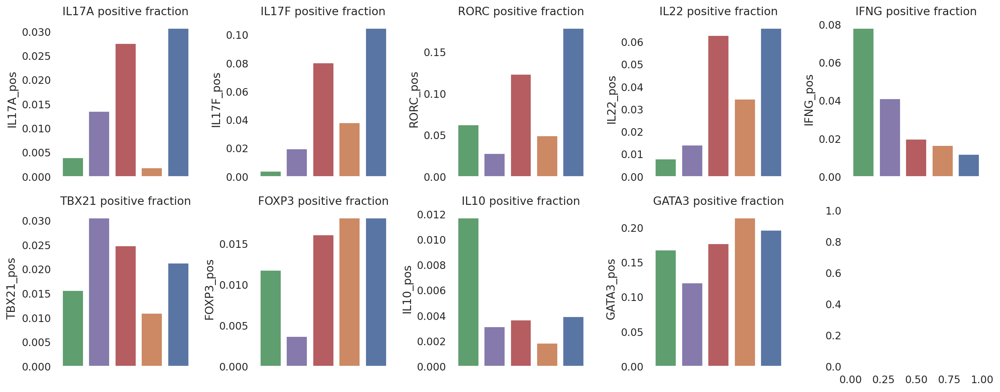

In [33]:
nrows = np.ceil(len(gene_list) / 5).astype(int)
order: list = ['HC', 'NL', 'Lesion', 'After_IL17_treatment_control', 'After_IL17_treatment']
fig, axes = plt.subplots(nrows, 5, figsize=(15, 3 * nrows))

for i, gene in enumerate(gene_list):
    adata_inte_t_helper_cell.obs[f"{gene}_exp"] = adata_inte_t_helper_cell.raw[:, gene].X.toarray().flatten()
    adata_inte_t_helper_cell.obs[f"{gene}_pos"] = adata_inte_t_helper_cell.obs[f"{gene}_exp"] > 0
    gene_fraction = adata_inte_t_helper_cell.obs.groupby('batch_group')[f"{gene}_pos"].sum() / adata_inte_t_helper_cell.obs.groupby('batch_group')[f"{gene}_pos"].count()
    gene_fraction = gene_fraction.reset_index()
    if i < len(gene_list):
        sns.barplot(data=gene_fraction, x='batch_group', y=f"{gene}_pos", hue='batch_group', order=order, dodge=False, ax=axes[i // 5, i % 5])
    sns.despine(left=True, bottom=True)
    # if i != len(gene_list) - 1:
    axes[i // 5, i % 5].get_legend().remove()
    axes[i // 5, i % 5].set_xlabel('')
    axes[i // 5, i % 5].set_xticklabels([])
    axes[i // 5, i % 5].set_xticklabels(axes[i // 5, i % 5].get_xticklabels(), rotation=45, ha='right')
    axes[i // 5, i % 5].set_title(f"{gene} positive fraction")
    fig.tight_layout()
    plt.savefig('figures/fig6/helper_t_cell_gene_positive_fraction.pdf', bbox_inches='tight')

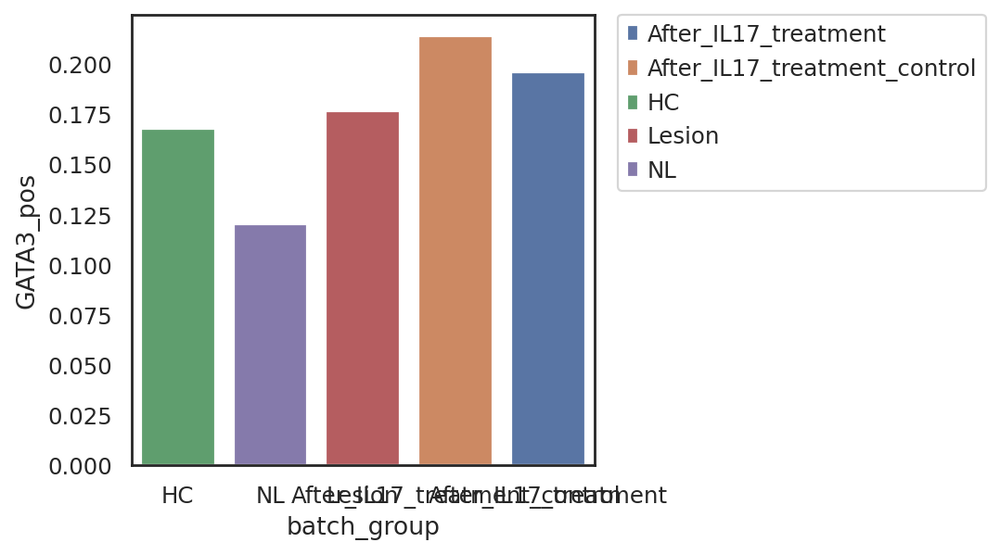

In [34]:
g = sns.barplot(data=gene_fraction, x='batch_group', y='GATA3_pos', hue='batch_group', order=order, dodge=False)
# set legend outside
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('figures/fig6/helper_t_cell_gene_positive_fraction_legend.pdf', bbox_inches='tight')